# Advanced Lane Finding Project

---

## Get the necessary data and libraries 


### Import the needed libraries and classes
   * numpy
   * cv2
   * matplotlib
   * ipython
   * glob
   * moviepy

In [1]:
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from IPython.display import HTML
import glob
from moviepy.editor import VideoFileClip

---

### Get the image data
   
   * calibration chessboard images
   * test images

In [2]:
calibrate = glob.glob('./camera_cal/calibration*.jpg')
images = glob.glob('./test_images/*.jpg')

---

### Computation of camera calibration using chessboard images

#### go through the calibration images
* read the images
* convert images to grayscale
* find chessboard corners
##### if corners were found
* add the objectpoints and imagepoints to objpoints and imgpoints
---
* calibrate the camera on the objpoints and imgpoints
#### go through the calibration images again
* read the images
* undistort the images
* show the normal and undistorted images using pyplot

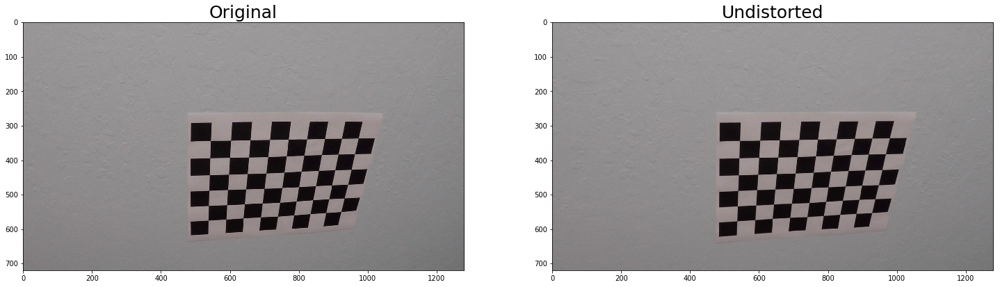

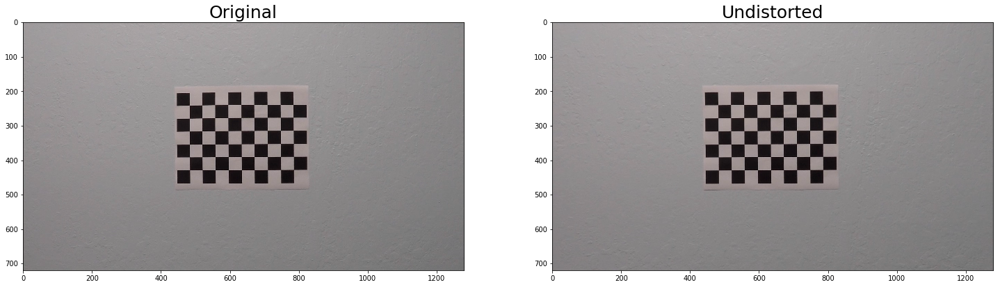

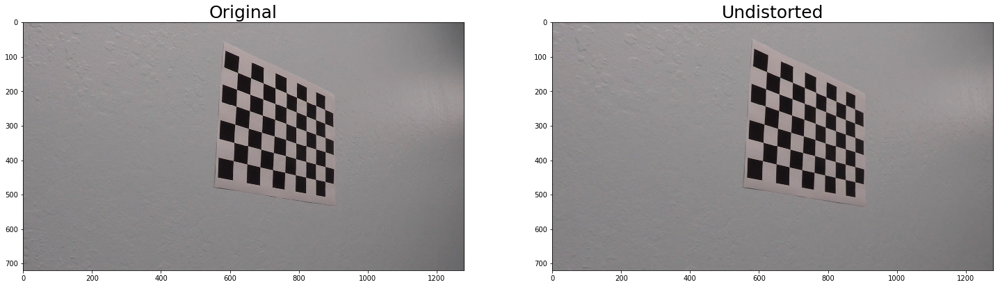

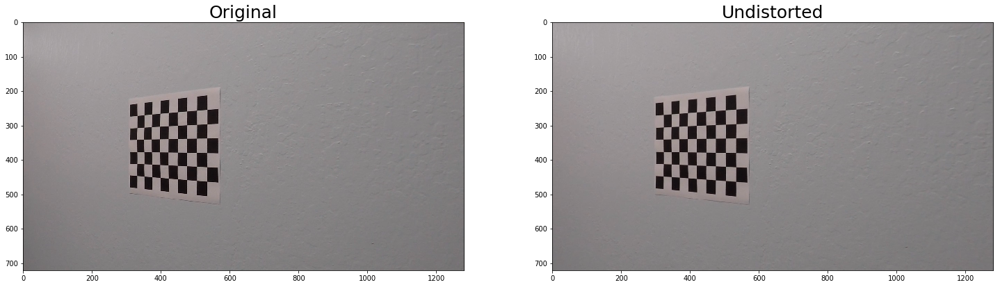

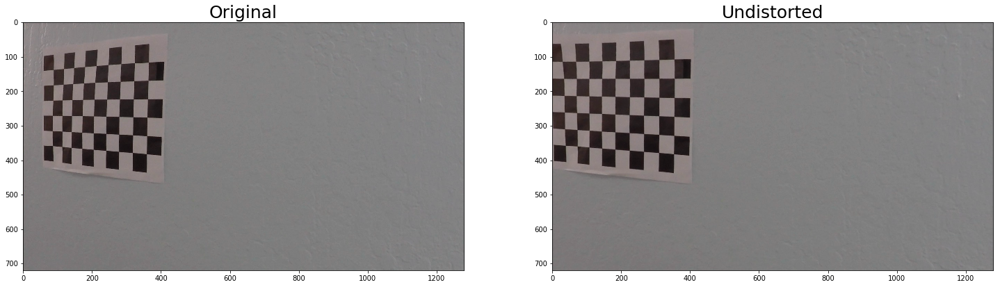

...

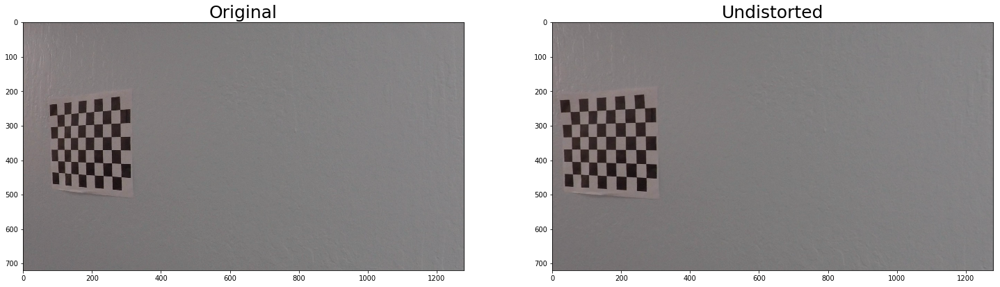

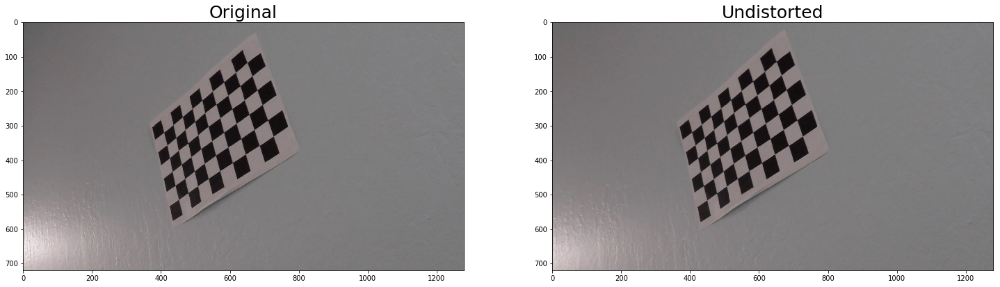

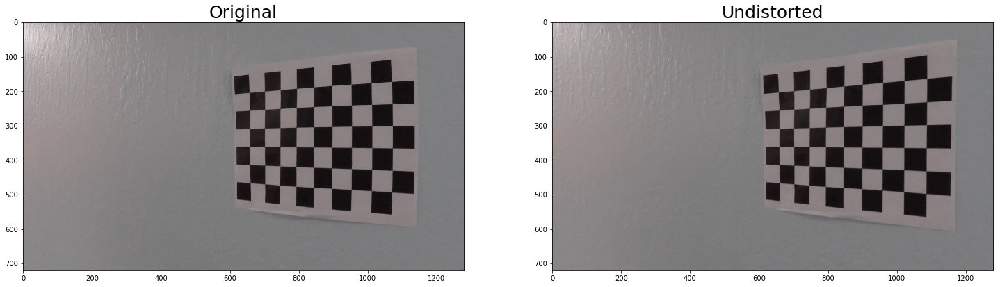

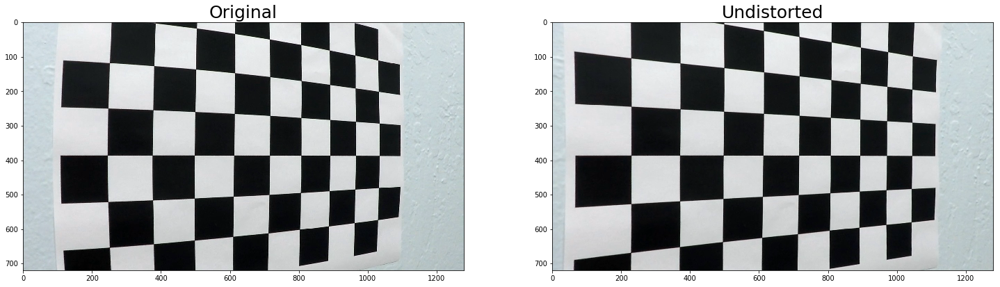

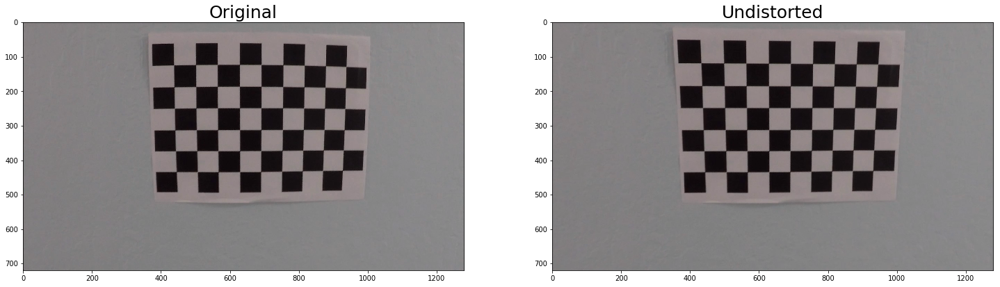

In [3]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.


# Step through the list and search for chessboard corners

def undistort(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

def calibrate_camera(img, objpoints, imgpoints):
    _, mtx, dist, _, _ = cv2.calibrateCamera(objpoints, imgpoints, img.shape[::1], None, None)
    return mtx, dist

for fname in calibrate:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    did_ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    # If found, add object points, image points
    if did_ret:
        objpoints.append(objp)
        imgpoints.append(corners)

mtx, dist = calibrate_camera(gray, objpoints, imgpoints)
for fname in calibrate:
    img = cv2.imread(fname)
    undistorted = undistort(img, mtx, dist)
    figure = plt.figure(fname)
    
    _, (ax1, ax2) = plt.subplots(1, 2, figsize = (25, 10))
    _ = ax1.imshow(img)
    _ = ax1.set_title("Original", fontsize = 25)
    _ = ax2.imshow(undistorted)
    _ = ax2.set_title("Undistorted", fontsize = 25)
# In this cell I calculate the camera calibration.
# Each calibration image is displayed to verify.

chessboard_columns = 9
chessboard_rows = 6

---

## Lane finding code

---

### Global Variables

In [4]:
nx = 8
ny = 6

window_width = 60 
window_height = 90
margin = 100

mean1 = 0
mean2 = 0
mean3 = 0
mean4 = 0
many = 0

last_overlay = None

---

### Helper Functions

---

#### corners_unwarp function
* undistort image
##### do thresholding on image
* do thresholding on saturation and hue by setting locations in a blank image where in the normal image at that location the color value is within a certain range to one
* do thresholding on value in the same way
* add thresholded images together
---
* do sobel on image
* warp perspective by getting the perspective transform then using arrays of the source and destination points on the image to do a perspective transform

In [5]:
def corners_unwarp(img, nx, ny, matrix, dist, do_show = False):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    thresh1 = (65., 70.)   #S
    thresh2 = (230., 255.) #V
    thresh3 = (30., 55.)   #H
    
    gray = undist[:,:,2]
    hue = undist[:,:,0]
    thresh1 = (thresh1[0] / 255.0, thresh1[1] / 255.0)
    s_channel = undist[:,:,1]
    
    binary = np.zeros_like(s_channel)
    binary2 = np.zeros_like(s_channel)
    
    binary[((s_channel > thresh1[0]) & (s_channel <= thresh1[1])) & ((hue > thresh3[0]) & (hue <= thresh3[1]))] = 1
    binary2[((gray > thresh2[0]) & (gray <= thresh2[1]))] = 1
    
    binary += binary2 # not the issue
    binary = np.abs(cv2.Sobel(binary, cv2.CV_64F, 1, 0))
    
    binary[binary > 0.0] = 1
    
    img_size = (img.shape[1], img.shape[0])
    imsx = img_size[0]
    imsy = img_size[1]
            
    xdist = 557
    src = np.array([[0, 700], [imsx, 700], [xdist, 450], [(imsx - xdist), 450]], np.float32)
    dst = np.array([[0, imsy], [imsx, imsy], [0, 0], [imsx, 0]], np.float32)
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    warped = cv2.warpPerspective(binary, M, img_size)
    if do_show: 
        plt.figure()
        undist2 = cv2.cvtColor(undist, cv2.COLOR_HSV2RGB) / 255.
        plt.imshow(undist2)
        plt.figure()
        plt.imshow(binary)
        plt.figure()
        plt.imshow(warped)

    # Return the resulting image and matrix
    return warped

---

#### find_window_centroids function
* get first window locations and add them to window_centroids
##### go through window y locations
* get window locations
* do a sanity check on the window location
* add window location to window_locations

In [6]:
def find_window_centroids(warped, window_width, window_height, margin):
    last_l_center = -100
    last_r_center = -100
    warped = np.array(warped)
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones((window_width)) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3 * warped.shape[0] / 4):,:int(warped.shape[1] / 2)], axis=0)
    l_center = np.argmax(np.convolve(window, l_sum)) - window_width / 2
    r_sum = np.sum(warped[int(3 * warped.shape[0] / 4):, int(warped.shape[1] / 2):], axis=0)
    r_center = np.argmax(np.convolve(window, r_sum)) - window_width / 2 + int(warped.shape[1] / 2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    lvl_cnt = range(0, len(window_centroids))
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        
        try:  
            l_min_index = int(max(l_center+offset-margin, 0))
            l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
            l_center = np.argmax(conv_signal[l_min_index:l_max_index]) + l_min_index-offset
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-margin, 0))
            r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
            r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
            # Add what we found for that layer
        
        except:
            l_center = last_l_center
            r_center = last_r_center
            
        sensetivity = 25.
        
        sensetivity = 100. - sensetivity
        dist = last_l_center - last_r_center
        
        if ((l_center + sensetivity) < last_l_center):
            l_center = r_center + dist #last_l_center
        else:
            last_l_center = l_center
        
        if ((r_center + sensetivity) < last_r_center):
            r_center = l_center - dist #last_r_center
        else:
            last_r_center = r_center
        
        window_centroids.append((l_center, r_center))
        
    return window_centroids

---

#### perspective_rewarp function
* unwarp perspective by warping the old destination points to the old source points

In [7]:
def perspective_rewarp(img):
    img_size = (img.shape[1], img.shape[0])
    imsx = img_size[0]
    imsy = img_size[1]
    
    xdist = 557
    
    src = np.array([[0, 700], [imsx, 700], [xdist, 450], [(imsx - xdist), 450]], np.float32)
    dst = np.array([[0, imsy], [imsx, imsy], [0, 0], [imsx, 0]], np.float32)
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(img, M, img_size)
    
    return warped

---

#### centroids_y function
##### loop through the windows
* calculate y center of the window
* append it to y_centroids

In [8]:
def centroids_y(window_centroids, windowsize):
    len_ = len(window_centroids)
    y_centroids = []
    for i in range(len_):
        var1 = windowsize / 2
        var2 = i * windowsize
        y_centroids.append(var1 + var2)
    return y_centroids

---

#### to_lines function
* find window centroids using the find_window_centroids function
* fit lines to the left and right window data using np.polyfit
* multiply the line fit by a y linespace to get the locations of coordinates of pixels in the lines
* calculate radius of left and right lane lines by using the [algorithm](http://www.intmath.com/applications-differentiation/8-radius-curvature.php) ((1 + (2Ay + B) ^ 2) ^ 3/4) / |2A| where A is the x squared coefficent in the line polynomial and B is the x coefficent
* overlay lane lines on a blank image
* calculate radius of lines in real world space
* put radius in text on new blank image
* return lane line image and text image

In [9]:
def to_lines(img, window_width, window_height, margin, do_check = False):
    global mean1
    global mean2
    global mean1
    global mean
    global many
    global last_overlay
    
    window_centroids = find_window_centroids(img, window_width, window_height, margin)

    get_side = lambda x, idx: [i[idx] for i in x]
    # Extract left and right line pixel positions
    leftx = get_side(window_centroids, 0)
    lefty = centroids_y(leftx, window_height)
    rightx = get_side(window_centroids, 1)
    righty = centroids_y(rightx, window_height)
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(np.flip(lefty, 0), leftx, 2)
    right_fit = np.polyfit(np.flip(righty, 0), rightx, 2)
    
    binary_warped = img
    
    rtnimg = np.copy(img)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2 * left_fit[0] * y_eval + left_fit[1]) ** 2) ** 1.5) / np.absolute(2 * left_fit[0])
    right_curverad = ((1 + (2 * right_fit[0] * y_eval + right_fit[1]) ** 2) ** 1.5) / np.absolute(2 * right_fit[0])
    
    width = img.shape[1]
    lastiteml = left_fitx[-1]
    lastitemr = right_fitx[-1]
    
    centers = window_centroids[0]
    meancenter = (centers[0] + centers[1]) / 2.
    dist =  (width / 2.) - meancenter
    ldist = (width / 2.) - lastiteml
    rdist = lastitemr - (width / 2.)
    
    rtnimg = np.array(cv2.merge((rtnimg, rtnimg, rtnimg))) * 255
    
    height = len(left_fitx)
    overlay = np.zeros_like(rtnimg)
    for y in range(height):
        left_x = int(np.round(left_fitx[y]))
        right_x = int(np.round(right_fitx[y]))
        if left_x >= 0 and left_x < width:
            overlay[y, max(left_x, 0):max(left_x + 20, 0), 2] = 125
        if right_x >= 0 and right_x < width:
            overlay[y, min(right_x - 20, width):min(right_x, width), 2] = 125
        if left_x < width and right_x > 0:
            overlay[y, max(left_x, 0):min(right_x, width), 2] = 100

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 360 # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700 # meters per pixel in x dimension

    if do_check:
        
        ldist2 = ldist * xm_per_pix
        rdist2 = rdist * xm_per_pix
        
        insensitive = 0.045
        if mean1 == 0:
            mean1 = ((mean1 * many) + ldist2) / (many + 1.)
            mean2 = ((mean2 * many) + rdist2) / (many + 1.)
        
        if many > 10:
            many = 10
        
        if ((np.abs(mean1 - ldist2) + np.abs(mean2 - rdist2)) < insensitive):
            last_overlay = overlay
            mean1 = ((mean1 * many) + ldist2) / (many + 1.)
            mean2 = ((mean2 * many) + rdist2) / (many + 1.)
        else:
            overlay = last_overlay
            tempmany = many + 2
            mean1 = ((mean1 * tempmany) + ldist2) / (tempmany + 1.)
            mean2 = ((mean2 * tempmany) + rdist2) / (tempmany + 1.)
        many += 1
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(np.array(lefty, np.float32)*ym_per_pix, np.array(leftx, np.float32)*xm_per_pix, 2)
    right_fit_cr = np.polyfit(np.array(righty, np.float32)*ym_per_pix, np.array(rightx, np.float32)*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * right_fit_cr[0])
    # Now our radius of curvature is in meters
    puttext = "left curve radius: " + str(left_curverad)
    puttext2 = "right curve radius: " + str(right_curverad)
    puttext3 = "left dist: " + str(ldist * xm_per_pix)
    puttext4 = "right dist: " + str(rdist * xm_per_pix)
    puttext5 = "lane center dist: " + str(dist * xm_per_pix) 
    
    text = cv2.putText(np.zeros_like(overlay), puttext,(10, 25), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 3)
    text += cv2.putText(np.zeros_like(overlay), puttext2,(10, 85), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 3)
    text += cv2.putText(np.zeros_like(overlay), puttext3,(10, 55), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 3)
    text += cv2.putText(np.zeros_like(overlay), puttext4,(10, 115), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 3)
    text += cv2.putText(np.zeros_like(overlay), puttext5,(10, 145), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 150), 3)
        
    return overlay, text

---

#### find_lines function
* brings to_lines, and corners_unwarp together

In [10]:
def find_lines(img, do_check = False):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    return to_lines(corners_unwarp(img, nx, ny, mtx, dist, not do_check), window_width, window_height, margin, do_check = do_check)

---

### Main Functions

---

#### image_do function
* used on test images
* find lines using find_lines
* warp perspective back to normal using perspective_rewarp
* change colorspace to rgb
* add lines to image and set color range to 0 to 1

In [11]:
def image_do(image):    
    if_first = False
    lines = find_lines(np.array(image, np.float32))
    rewarped = perspective_rewarp(lines[0])
    rewarped = cv2.cvtColor(rewarped.astype(np.float32), cv2.COLOR_HSV2BGR)
    rewarped2 = cv2.cvtColor(rewarped, cv2.COLOR_HSV2RGB)
    image2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    return np.clip((image2.astype(np.float32) + rewarped2 + lines[1]) / 255, 0., 1.)

---

#### image_video function
* used on test videos
* find lines using find_lines
* warp perspective back to normal using perspective_rewarp
* change colorspace back to rgb
* add lines to image and set color range to 0 to 255

In [12]:
def image_video(image):
    lines = find_lines(np.array(image, np.float32), do_check = True)
    rewarped = perspective_rewarp(lines[0])
    rewarped = cv2.cvtColor(rewarped.astype(np.float32), cv2.COLOR_HSV2BGR)
    rewarped2 = cv2.cvtColor(rewarped, cv2.COLOR_HSV2RGB)
    image2 = image
    
    return np.clip((image2.astype(np.float32) + rewarped2 + lines[1]), 0., 255.)

---

### Run image_do on test images

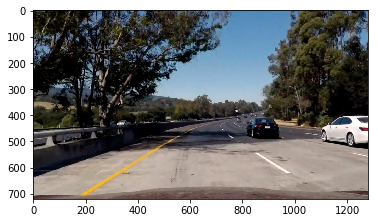

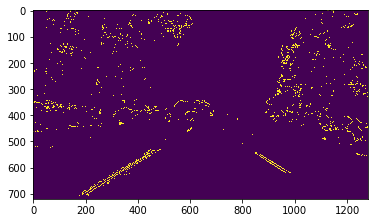

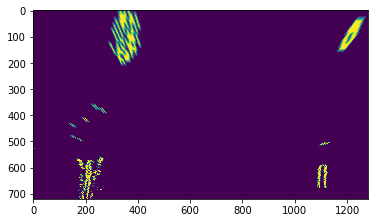

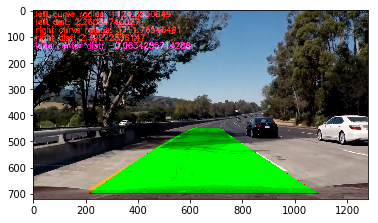

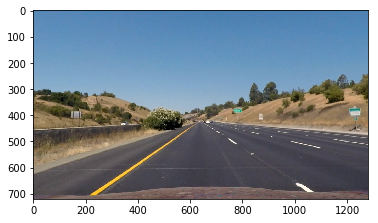

...

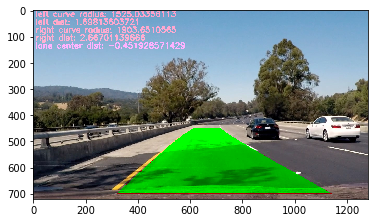

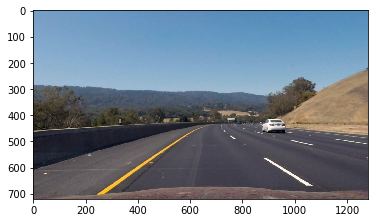

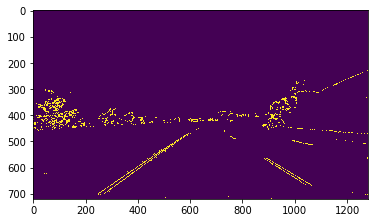

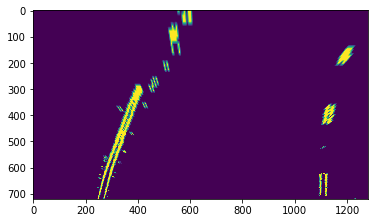

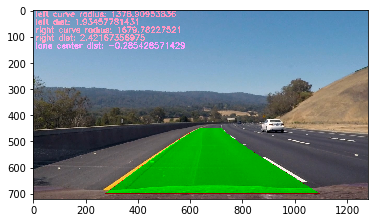

In [13]:
for image in images:
    image = cv2.imread(image)
    image = image_do(image)
    plt.figure()
    plt.imshow(image)

---

### Run image_video on [project_video.mp4](https://github.com/udacity/CarND-Advanced-Lane-Lines/blob/master/project_video.mp4)

In [14]:
video_output = 'output_images/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")#.subclip(0, 5.0)
white_clip = clip1.fl_image(image_video)
%time white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_images/project_video.mp4
[MoviePy] Writing video output_images/project_video.mp4


100%|█████████▉| 1260/1261 [07:05<00:00,  2.96it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video.mp4 

CPU times: user 4min 20s, sys: 40.2 s, total: 5min
Wall time: 7min 8s


In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))